# Unsupervised Image Exploration Through Clustering

Github project link: https://github.com/KenMcCarthy24/DTSA_5510_Final

The purpose of this project is to use purely unsupervised machine learning techniques to explore and learn more about the contents of a dataset containing images of various fruits. 

A clustering algorithm will be applied to the data in order to identify groups of images that are similar to one another, with the goal being that these clusters correspond to individual fruits or interesting subgroups of fruits. 

# Import Libraries and Define Helper Functions

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score

import seaborn as sns

from PIL import Image

In [3]:
def display_random_images(image_data_array, N):
    """Displays N random images from the given image_data_array"""
    # Calculate the grid size
    grid_size = int(np.ceil(np.sqrt(N)))

    # Randomly select N images
    selected_images = np.random.choice(image_data_array.shape[0], N, replace=False)

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(10, 10))

    for i, ax in enumerate(axs.flatten()):
        if i < N:
            ax.imshow(image_data_array[selected_images[i]])
            ax.axis('off')  # Turn off axis for each subplot
        else:
            fig.delaxes(ax)  # Remove excess subplots

    plt.tight_layout()
    plt.show()
    
def calc_color_histograms(image_array):
    "Returns color histograms for the R, B, and B channels of the provided image array"
    red_array = image_array[:,:,0]
    blue_array = image_array[:,:,1]
    green_array = image_array[:,:,2]
    
    red_hist, _ = np.histogram(red_array.flatten(), bins=np.arange(0, 256))
    blue_hist, _ = np.histogram(blue_array.flatten(), bins=np.arange(0, 256))
    green_hist, _ = np.histogram(green_array.flatten(), bins=np.arange(0, 256))
    
    return np.vstack((red_hist, blue_hist, green_hist))

def plot_color_histograms(color_hists):
    """Plots the color histograms given by color_hists, making one plot for each channel"""
    bins = bins=np.arange(0, 255)
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].bar(bins, color_hists[0], color="red")
    axs[0].set_ylim([0, 400])
    axs[0].set_xlabel("Red Value")
    axs[0].set_ylabel("Count")
    
    axs[1].bar(bins, color_hists[1], color="green")
    axs[1].set_ylim([0, 400])
    axs[1].set_xlabel("Green Value")
    axs[1].set_ylabel("Count")
    
    axs[2].bar(bins, color_hists[2], color="blue")
    axs[2].set_ylim([0, 400])
    axs[2].set_xlabel("Blue Value")
    axs[2].set_ylabel("Count")
    
    plt.show()

# The Dataset

The dataset used for this project comes from Kaggle and consists of a large number of 100x100 pixel images of various types of fruit. The dataset comes divided into a train and a test set with the train set being labeled with what type of fruit each image depicts. For the purpose of this project, both this train test split and the labels on the training data will be disregarded and unsupervised techniques will be used to analyze the train and test set together to try to learn about the full dataset without relying on the labels. 

Link to Dataset: https://www.kaggle.com/datasets/sshikamaru/fruit-recognition

Start by loading a single test image to get an idea of the structure of each image. 

Data Shape = (100, 100, 3)


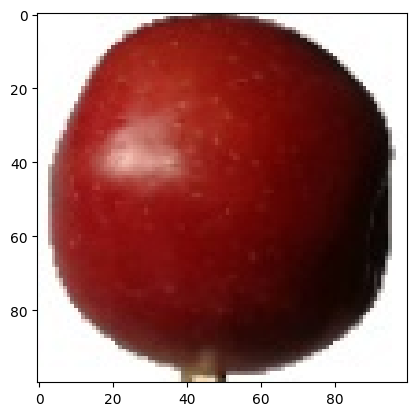

In [4]:
test_image = "./Fruit Data/train/train/Apple Braeburn/Apple Braeburn_0.jpg"
img = np.array(Image.open(test_image))
print(f"Data Shape = {img.shape}")

plt.imshow(img)
plt.show()

Each fruit image is 100x100 pixels large and contains three color channels: red, green, and blue. As with any data extracted from an image, each channel contains integer values ranging from 0 to 255, signifying the intensity of its respective color within each pixel. The images have also undergone prior preprocessing, removing the background and replacing it with a white one to effectively isolate the fruit.

The full dataset consists of 16854 training images and 5641 test images. Next, all of these images will be loaded and stored in one large numpy array of shape (22495, 100, 100, 3), removing the distinction between train and test data.

In [5]:
train_set_image_number = 16854
test_set_image_number = 5641

img_data_array = np.empty((train_set_image_number + test_set_image_number, 100, 100, 3), dtype=int)
i = 0

# Load in Train Data, ignore labels
for folder_name in os.listdir("./Fruit Data/train/train"):
    fruit_folder = os.path.join("./Fruit Data/train/train", folder_name)
    for filename in os.listdir(fruit_folder):
        image_file = os.path.join(fruit_folder, filename)
        img = Image.open(image_file)
        img_array = np.asarray(img)
        img_data_array[i] = img_array
        i += 1
        
# Load in Test Data
for filename in os.listdir("./Fruit Data/test/test"):
    image_file = os.path.join("./Fruit Data/test/test", filename)
    img = Image.open(image_file)
    img_array = np.asarray(img)
    img_data_array[i] = img_array
    i += 1

Next, visualize a large amount of sample images to make sure earlier assumptions about the data structure are correct. 

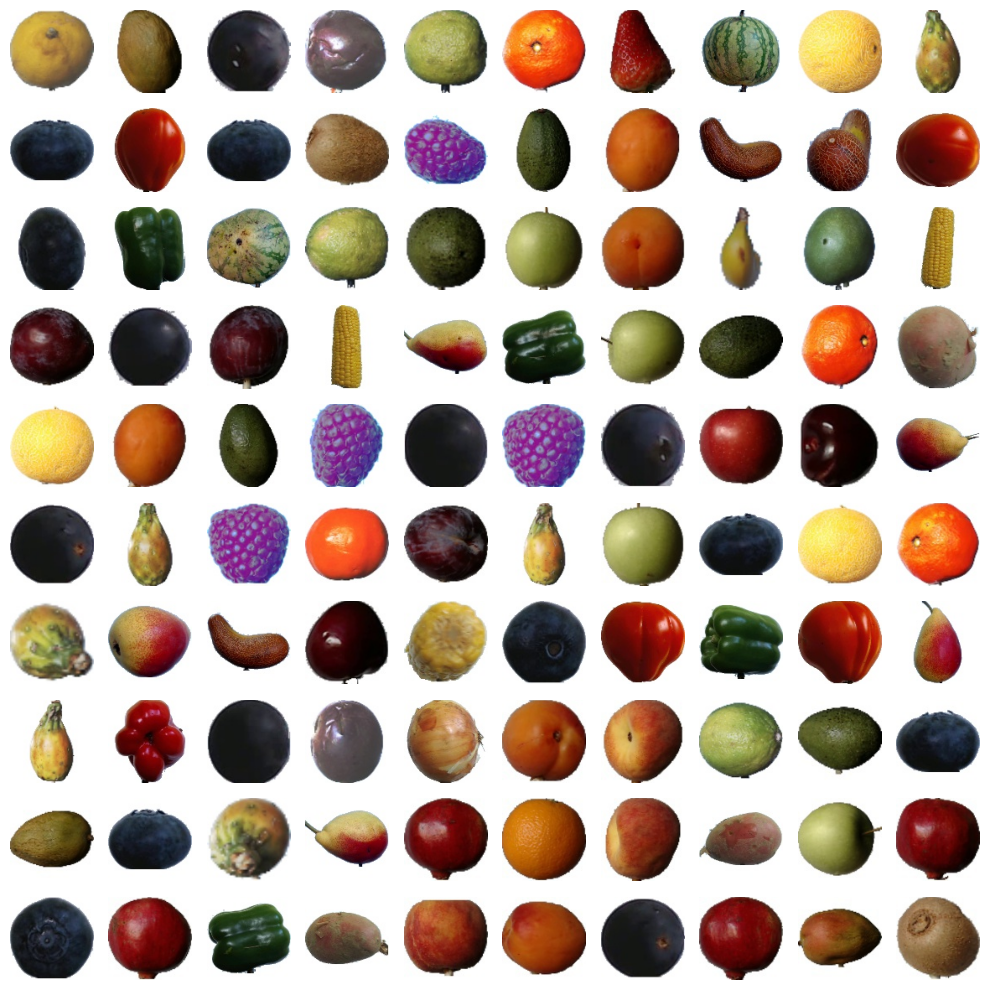

In [6]:
display_random_images(img_data_array, 100)

As expected, each image is of the same size and has an image of a single fruit on a white background.

# Vectorizing the Images

Each individual image is currently stored as a (100, 100, 3) numpy array representing the three color channels of each pixel. Although this is a standard method for storing image data, it isn't ideal for machine learning algorithms which typically function on a single 1D feature vector per sample. So in order to be useful for machine learning each image needs to be converted into a 1D feature vector.

A straightforward way to achieve this is to flatten each image's (100, 100, 3) array into a (1, 30000) array, using the direct RGB values of each pixel as machine learning features. One issue with this approach is that 30000 features is a very high dimensional space that most machine learning algorithms would struggle to work in, especially in a computationally fast way. Also, each channel and pixel is treated independently as a unique feature, ignoring the relation to other pixels within the image.

Another approach, and the one that will be used in this project,  involves converting the image to color histograms. This image processing method determines the distribution of colors by computing a histogram of the frequency of each possible color intensity value (ranging from 0 to 255) in each image channel. This results in a (1, 255) feature vector per channel, which can be concatenated to obtain a final (1, 765) feature vector for an image. Working with 765 features is much more manageable than 30000, and color histograms provide a better representation of the image's color content, as opposed to treating each value in isolation.

To get an idea of what these color histograms look like, below are a few examples.

#### Example 1

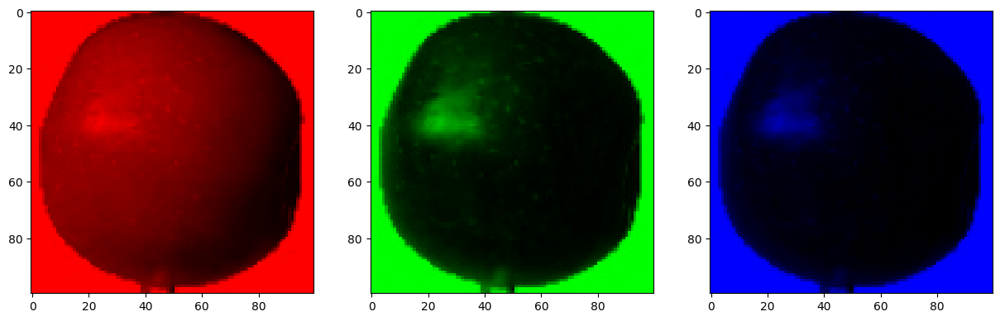

In [78]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i in [0, 1, 2]:
    temp = np.zeros(img_data_array[0].shape, dtype=int)
    temp[:, :, i] = img_data_array[0][:, :, i]

    axs[i].imshow(temp)

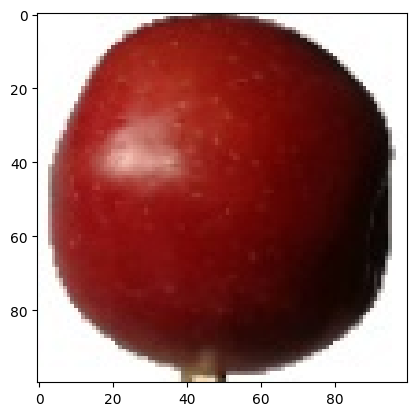

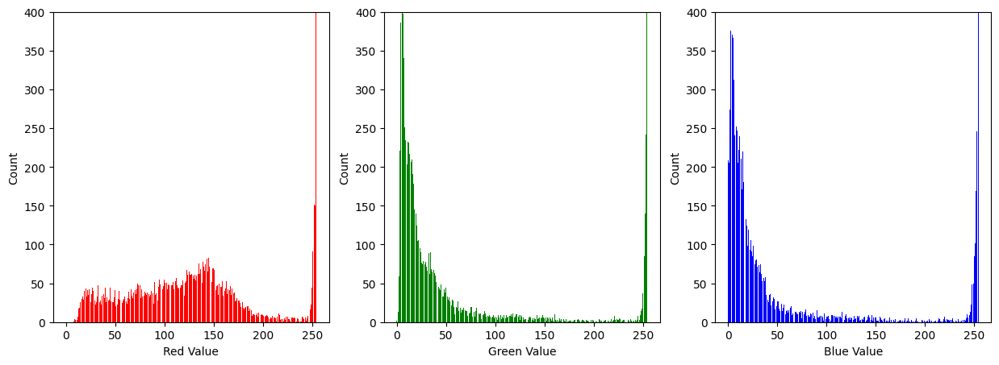

In [7]:
plt.imshow(img_data_array[0])
plot_color_histograms(calc_color_histograms(img_data_array[0]))

This image of an apple appears visually dark red and the color histograms show it as having mostly low intensities in the green and blue channel while having a wide distribution of intensities in the red channel. There is also a large spike in intensity around 255 in each channel. In RGB white is represented by 255 in each channel so these spikes represent the white and near-white pixels that make up the background of the image. 

#### Example 2

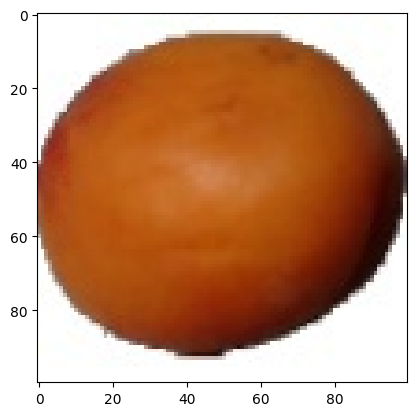

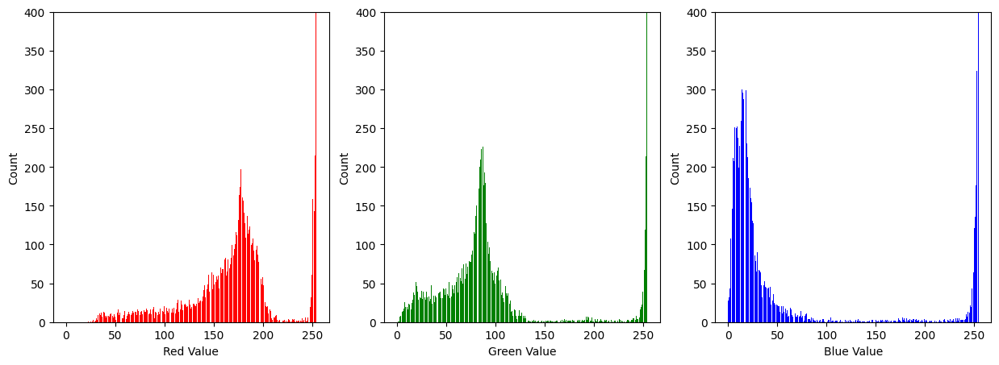

In [8]:
plt.imshow(img_data_array[1000])
plot_color_histograms(calc_color_histograms(img_data_array[1000]))

This image of an apricot appears visually yellow-orange and its histograms show it contains many higher intensity values in its red and green channels while mostly having lower intensities in its blue channel. Again, there is a spike near 255 in each channel, representing the white background.

#### Example 3

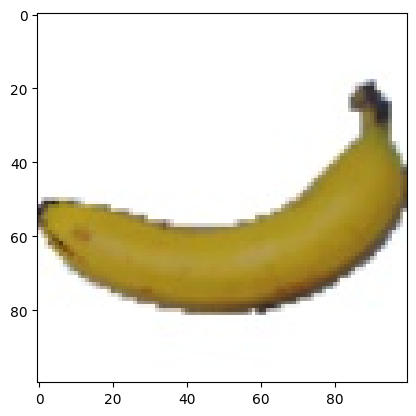

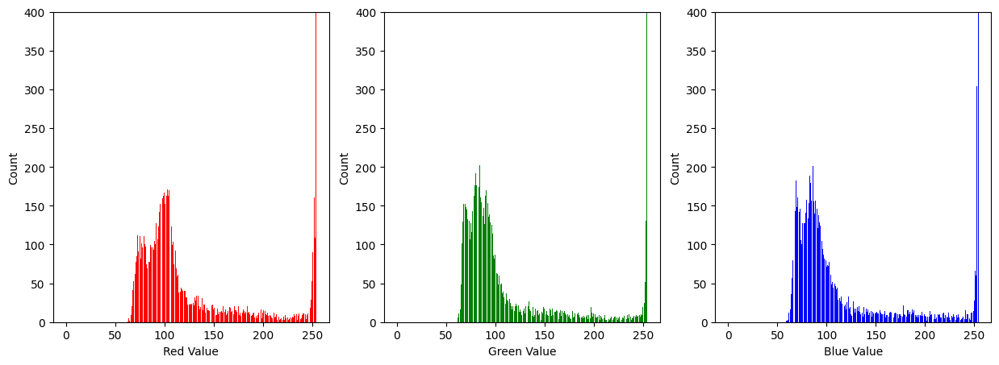

In [9]:
plt.imshow(img_data_array[2000])
plot_color_histograms(calc_color_histograms(img_data_array[10000]))

This image of a banana is visually yellow has very similarly shaped distribution of intensities in all three of its channels, notably with no intensities below 50 in any channel. The banana's long and skinny shape means that there are more white pixels in this image than in the previous two examples, meaning that the spikes at 255 in each channel are even higher. This shows that these color histograms can even help to encode some information about the shape of the fruit in addition to its color content. 

Now, a color histogram will be created for each fruit image in the dataset to create a final (22495, 765) array that will act as the data matrix for this project going forward.

In [10]:
X = np.empty((len(img_data_array), 3*255))
for i in range(len(img_data_array)):
    X[i] = calc_color_histograms(img_data_array[i]).flatten()
    
print(f"Data matrix X created with shape {X.shape}")

Data matrix X created with shape (22495, 765)


# Dimensionality Reduction

At this point each image has 765 features. While this is significantly less than the 30000 features using the alternate vectorization method, it is still a very high-dimensional space. This dimensionality could be further reduced to enhance the performance of machine learning algorithms and avoid the 'curse of dimensionality.'

In order to perform dimensionality reduction, Principal Component Analysis (PCA) will be used. PCA finds a series of vectors in the feature space that represents the orthogonal directions of highest variance, called the principal components. These principal components are the normalized eigenvectors of the data's covariance matrix, ordered by the magnitude of their corresponding eigenvalues. Its is possible that a high percentage of the total variance of the data matrix can be explained by only a few principal components. These significant components can then be used to downscale the data to a lower-dimensional space, retaining most of the original data's information in a significantly reduced number of dimensions.

Start by fitting a PCA model to the data. In order for PCA to perform well, it must be standardized so that every feature has zero mean. 

In [34]:
#Standardize Data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit PCA
pca1 = PCA()
pca1.fit(X_scaled)

PCA()

In order to get an idea of how much variance is explained by each number of principal components. A cumulative variance explained plot will be made. On this plot the x axis represents a number of principal components to be used and the y axis represents the percentage of the total variance captured by those principal components. Additional annotations in the form of red dotted lines are also added to show at what number of principal components 50%, 90%, and 95% of the variance is explained. 

50% of Variance Explained with 5 principal components
90% of Variance Explained with 35 principal components
95% of Variance Explained with 100 principal components


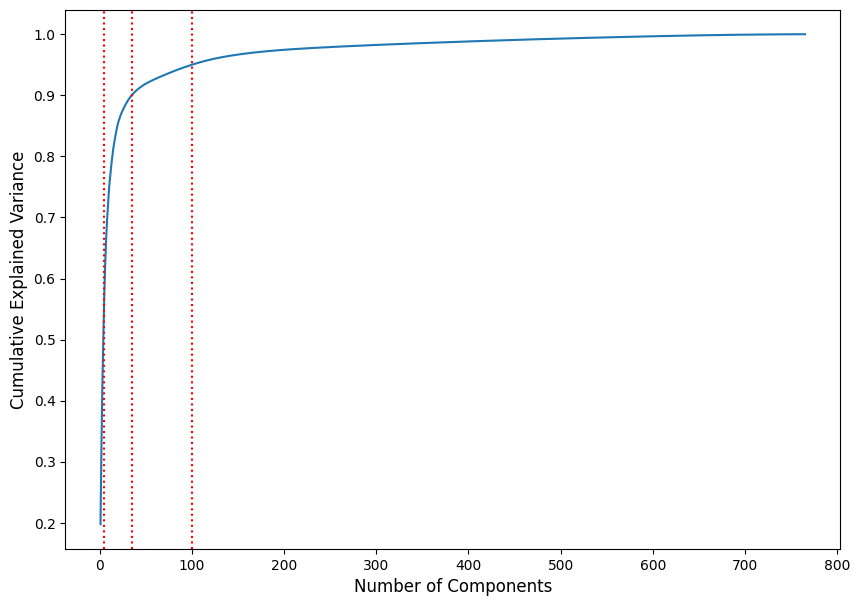

In [36]:
pve = pca1.explained_variance_ratio_
cve = np.cumsum(pve)

# Identify points where explained variance is 50%, 90%, and 95%
components_50 = np.where(cve >= 0.5)[0][0] + 1
components_90 = np.where(cve >= 0.9)[0][0] + 1
components_95 = np.where(cve >= 0.95)[0][0] + 1

plt.figure(figsize=(10,7))
plt.plot(range(1, len(cve)+1), cve)
plt.xlabel('Number of Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)

for components, explained_variance in zip([components_50, components_90, components_95], [0.5, 0.9, 0.95]):
    plt.axvline(x=components, linestyle=':', color='red')
    
    
print(f"50% of Variance Explained with {components_50} principal components")
print(f"90% of Variance Explained with {components_90} principal components")
print(f"95% of Variance Explained with {components_95} principal components")
    
plt.show()

This shows that the 765 dimensions of the data matrix can indeed be meaningfully reduced to a much smaller number of features while maintaining a high amount of the variance of the original data. What is not obvious, however, is the exact correct number of principal components to use. Instead of setting a potentially arbitrary threshold based on the cumulative variance explained to determine the number of principal components, the number of principal components to use will instead be treated as an adjustable parameter, and optimized along the clustering algorithm's hyper-parameters. 

# Low Dimension Visualizaiton

Another application of PCA is to choose only the first two principal components and use them to project the data down into two dimensions. This allows the high dimensional data to be visualized and inspected on a simple two dimensional plot to get an idea of the structure of the data, including the number of obvious clusters that appear within it. 

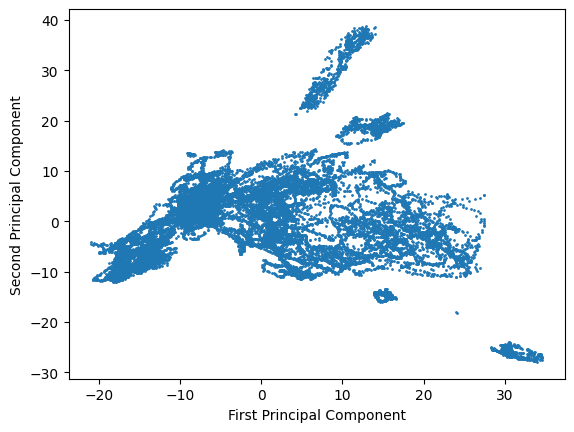

In [38]:
pca3 = PCA(n_components=2)
dim1, dim2 = pca3.fit_transform(X_scaled).T

plt.scatter(dim1, dim2, s=1)
plt.xlabel("First Principal Component")
plt.ylabel("Second Principal Component")
plt.show()

Observations:
* There are 5 obvious clusters of data in this 2 dimensional space
* One cluster in the center contains a majority of the data, but possibly has more clusters that cannot be seen in two dimensions

# Clustering

In order to find noteworthy substructures within the data, a clustering algorithm will be used to sort each data point into one of many clusters. The specific clustering algorithm that will be used is Agglomerative Clustering. In this algorithm, each data point initially starts off in its own cluster and clusters are repeatedly combined based on how close they are together until the specified number of clusters is reached. 

There are four parameters that can be varied in this approach that will greatly effect the clusters found:
1. The total number of principal components used.
2. The number of clusters to have in the end
3. The metric used to define the distance between clusters
4. The linkage method, or the method used to determine the points to calculate the distance between

In contrast to supervised learning, the accuracy score cannot be used to measure the effectiveness of different parameter sets due to the absence of a ground truth. However, several recognized metrics can measure the performance of a clustering algorithm. For this project, the Silhouette Score will be used.

The Silhouette Coefficient $s_i$ of a given point is calculated by first determining two values:

a = Mean distance between the point and all other points in the same cluster.

b = Mean distance between the point and all other points in the nearest other cluster.

Then, $s_i$ is computed as follows:

$$s_i = \frac{b-a}{max(a, b)}$$

The coefficient $s_i$ ranges between -1 and 1. Negative values suggest that a value has been assigned to the incorrect cluster, while positive values indicate correct assignment.

Lastly, the Silhouette Score $S$ is the mean of the Silhouette Coefficients across all data points. The higher this value, the better the clustering algorithm performed.

$$S = \frac{1}{n}\sum_{i=0}^n s_i$$

Reference: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

Next, in order to find the set of parameters that lead to the best performance, A PCA followed by an Agglomerative Clustering model will be fit for all combinations of a defined search range of parameters. The chosen parameters to search through are not a complete list of possibilities, but for the sake of computational efficiency, the parameters considered will be limited to the defined ranges. 

In [162]:
component_numbers = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
linkages = ["ward", "complete", "average", "single"]
distance_metrics = ["euclidean", "l1", "l2", "manhattan", "cosine"]
n_clusters = [5, 6, 7, 8, 9, 10]


results_df = pd.DataFrame(columns=["N Components", "Linkage", "Distance Metric", "N Clusters", "Silhouette"])
for component_number in component_numbers:
    pca = PCA(n_components=component_number)
    X_pca = pca.fit_transform(X_scaled)
    
    for linkage in linkages:
        for distance_metric in distance_metrics:
            for n in n_clusters:
                if linkage == "ward" and distance_metric != "euclidean":
                    continue
                
                print(component_number, linkage, distance_metric, n)
                ag = AgglomerativeClustering(n_clusters=n, linkage=linkage, metric=distance_metric)
                ag_results = ag.fit_predict(X_pca)
                
                silhouette = silhouette_score(X_pca, ag_results)
                
                results_df.loc[len(results_df.index)] = [component_number, linkage, distance_metric, n, silhouette]


10 ward euclidean 5
10 ward euclidean 6
10 ward euclidean 7
10 ward euclidean 8
10 ward euclidean 9
10 ward euclidean 10
10 complete euclidean 5
10 complete euclidean 6
10 complete euclidean 7
10 complete euclidean 8
10 complete euclidean 9
10 complete euclidean 10
10 complete l1 5
10 complete l1 6
10 complete l1 7
10 complete l1 8
10 complete l1 9
10 complete l1 10
10 complete l2 5
10 complete l2 6
10 complete l2 7
10 complete l2 8
10 complete l2 9
10 complete l2 10
10 complete manhattan 5
10 complete manhattan 6
10 complete manhattan 7
10 complete manhattan 8
10 complete manhattan 9
10 complete manhattan 10
10 complete cosine 5
10 complete cosine 6
10 complete cosine 7
10 complete cosine 8
10 complete cosine 9
10 complete cosine 10
10 average euclidean 5
10 average euclidean 6
10 average euclidean 7
10 average euclidean 8
10 average euclidean 9
10 average euclidean 10
10 average l1 5
10 average l1 6
10 average l1 7
10 average l1 8
10 average l1 9
10 average l1 10
10 average l2 5
10 a

50 complete cosine 5
50 complete cosine 6
50 complete cosine 7
50 complete cosine 8
50 complete cosine 9
50 complete cosine 10
50 average euclidean 5
50 average euclidean 6
50 average euclidean 7
50 average euclidean 8
50 average euclidean 9
50 average euclidean 10
50 average l1 5
50 average l1 6
50 average l1 7
50 average l1 8
50 average l1 9
50 average l1 10
50 average l2 5
50 average l2 6
50 average l2 7
50 average l2 8
50 average l2 9
50 average l2 10
50 average manhattan 5
50 average manhattan 6
50 average manhattan 7
50 average manhattan 8
50 average manhattan 9
50 average manhattan 10
50 average cosine 5
50 average cosine 6
50 average cosine 7
50 average cosine 8
50 average cosine 9
50 average cosine 10
50 single euclidean 5
50 single euclidean 6
50 single euclidean 7
50 single euclidean 8
50 single euclidean 9
50 single euclidean 10
50 single l1 5
50 single l1 6
50 single l1 7
50 single l1 8
50 single l1 9
50 single l1 10
50 single l2 5
50 single l2 6
50 single l2 7
50 single l

90 average cosine 5
90 average cosine 6
90 average cosine 7
90 average cosine 8
90 average cosine 9
90 average cosine 10
90 single euclidean 5
90 single euclidean 6
90 single euclidean 7
90 single euclidean 8
90 single euclidean 9
90 single euclidean 10
90 single l1 5
90 single l1 6
90 single l1 7
90 single l1 8
90 single l1 9
90 single l1 10
90 single l2 5
90 single l2 6
90 single l2 7
90 single l2 8
90 single l2 9
90 single l2 10
90 single manhattan 5
90 single manhattan 6
90 single manhattan 7
90 single manhattan 8
90 single manhattan 9
90 single manhattan 10
90 single cosine 5
90 single cosine 6
90 single cosine 7
90 single cosine 8
90 single cosine 9
90 single cosine 10
100 ward euclidean 5
100 ward euclidean 6
100 ward euclidean 7
100 ward euclidean 8
100 ward euclidean 9
100 ward euclidean 10
100 complete euclidean 5
100 complete euclidean 6
100 complete euclidean 7
100 complete euclidean 8
100 complete euclidean 9
100 complete euclidean 10
100 complete l1 5
100 complete l1 6
10

The above cell takes several hours to run, so dump the results to file so they can easily be loaded back in if need be without rerunning the grid search. 

In [51]:
with open("./clustering_results.csv", "w+") as f:
    results_df.to_csv(f, index=False)

Now, find the parameter set that lead to the highest Silhouette Score.

In [50]:
best_parameters = results_df.iloc[results_df["Silhouette"].idxmax()]
best_parameters

N Components              10
Linkage              average
Distance Metric    euclidean
N Clusters                10
Silhouette          0.388809
Name: 41, dtype: object

Interestingly, the optimization found the best performance with using only ten principal components, representing only around 75% of the variance of the original data. This could indicate that a lot of the variance of the original data was caused by artifacts or noise and is not useful for analysis. 

Finally, use the ideal parameters to build the final clustering model and create an array of the final cluster labels. 

In [54]:
pca = PCA(n_components=best_parameters["N Components"])
X_pca = pca.fit_transform(X_scaled)

ag = AgglomerativeClustering(n_clusters=best_parameters["N Clusters"],
                             metric=best_parameters["Distance Metric"],
                             linkage=best_parameters["Linkage"])

final_cluster_labels = ag.fit_predict(X_pca)

# Clustering Results Analysis

Start by visualizing the discovered clusters of data on the plot of the first two principal components.

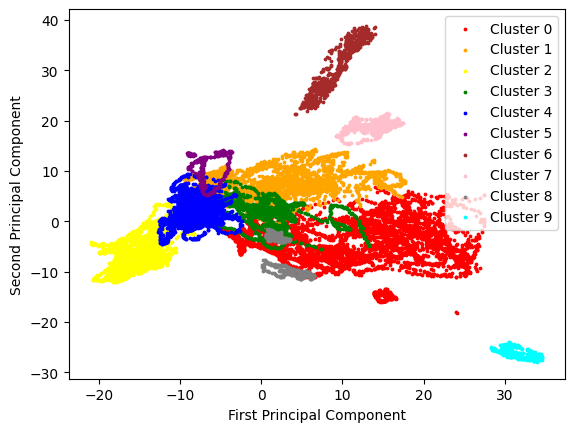

In [56]:
colors = ["red", "orange", "yellow", "green", "blue", "purple", "brown", "pink", "gray", "cyan"]

for i in np.unique(final_cluster_labels).astype(int):
    plt.scatter(dim1[final_cluster_labels == i], dim2[final_cluster_labels == i], s=3, color=colors[i], label=f'Cluster {i}')

plt.legend()
plt.xlabel("First Principal Component")
plt.ylabel("Second Principal Component")
plt.show()

Observations:
* The large central cluster was found to consist of several smaller clusters in high dimensional space
* Three of the visually obvious clusters of data were found, becoming clusters 6, 7, and 9. 
* One of the visually obvious clusters was not found, the one that sits at around (18, -15) on the above plot. Perhaps something happens in the higher dimensional space that makes the other found clusters more distinct than this one and it would eventually be found with a higher number of clusters.

As the final step of the analysis, a sample of 100 images from each cluster will be plotted to see what visual similarities exist that lead the algorithm to place them in the same cluster. A name will be manually created for each cluster based on visual inspection. 

#### Cluster 9

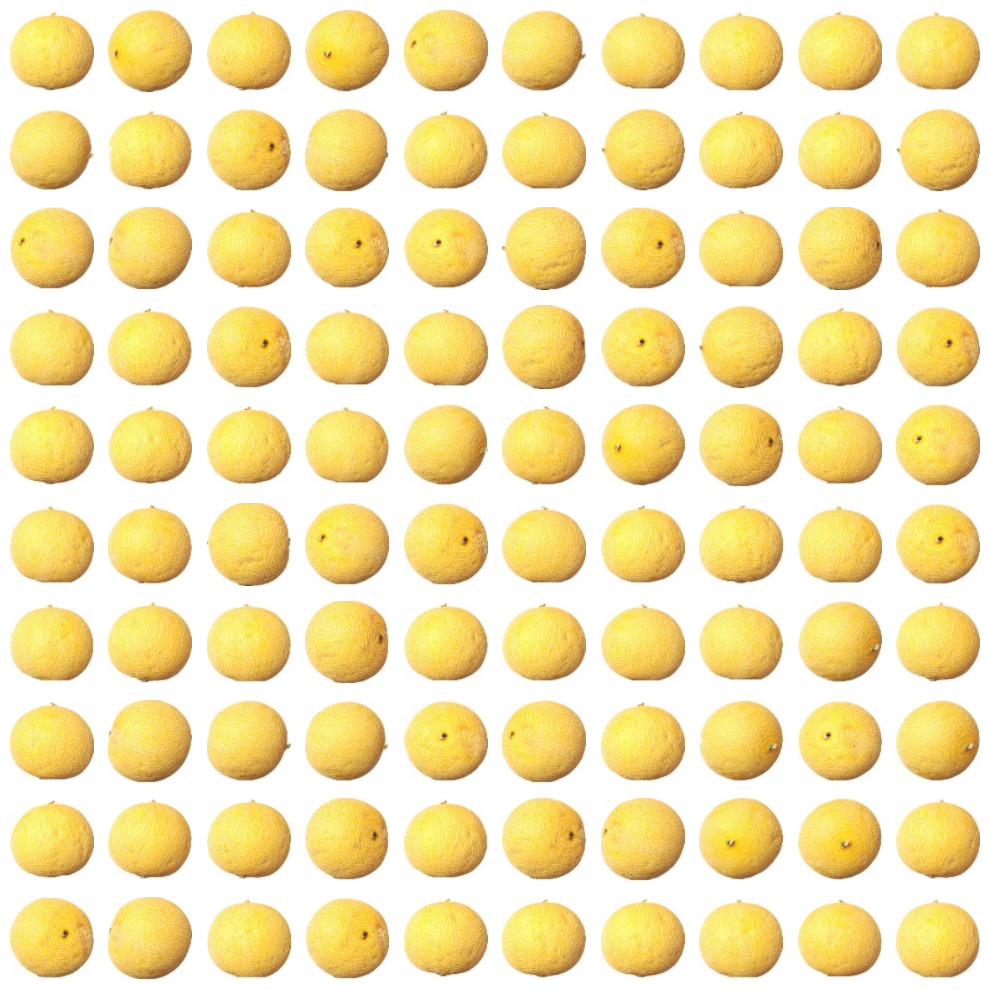

In [174]:
display_random_images(img_data_array[final_cluster_labels == 9], 100)

All of these are images of cantaloupe, meaning that the clustering was successfully able to isolate images of cantaloupe from the other fruit. This will be called the **Cantaloupe Cluster**.

#### Cluster 8

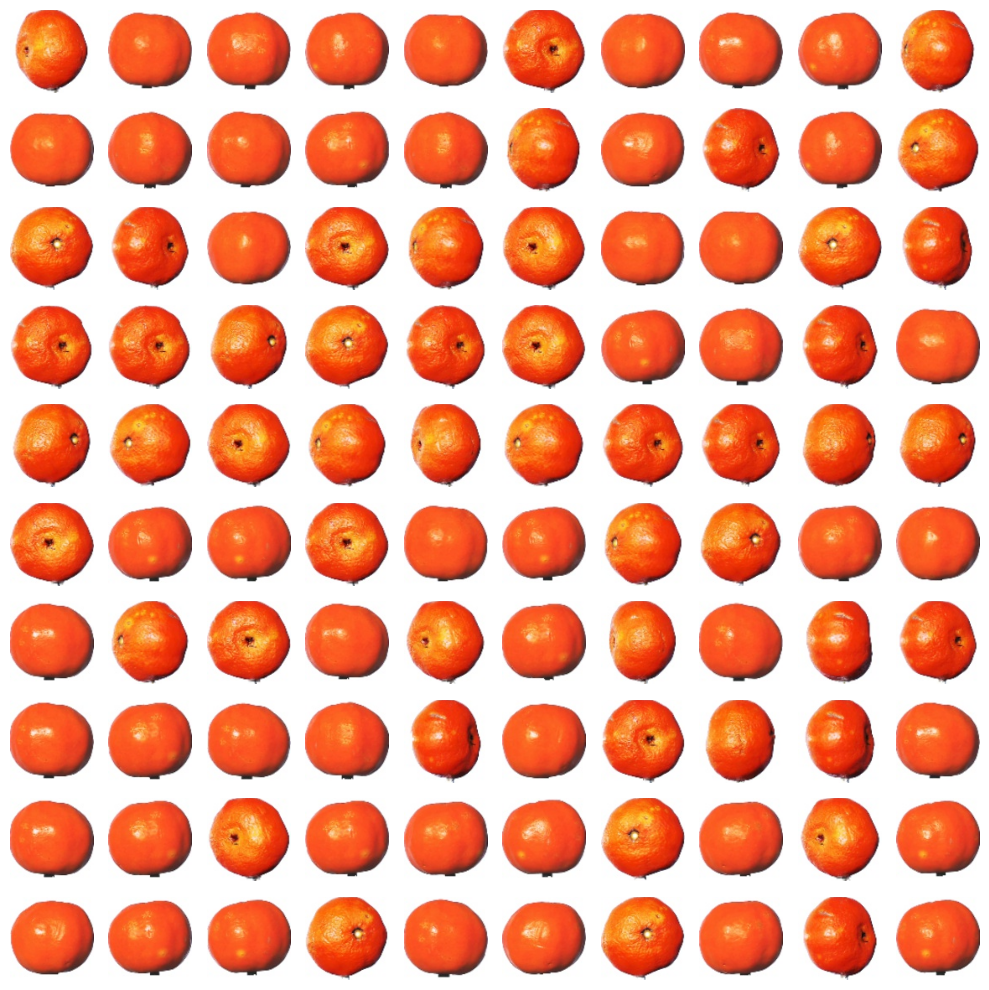

In [175]:
display_random_images(img_data_array[final_cluster_labels == 8], 100)

Similarly, all of these are images of clementines, this will be the **Clementine Cluster**

#### Cluster 7

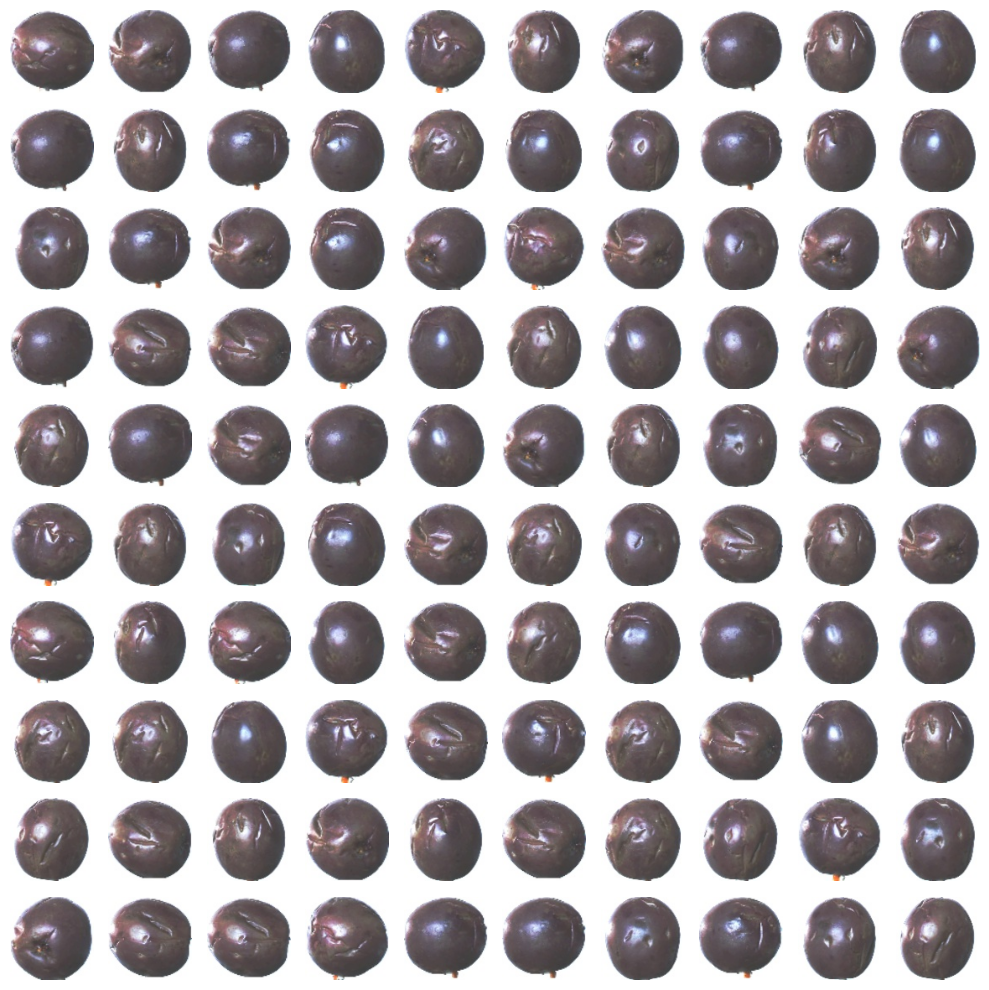

In [176]:
display_random_images(img_data_array[final_cluster_labels == 7], 100)

All of these are images of passion fruit, so this will be the **Passion Fruit Cluster**

#### Cluster 6

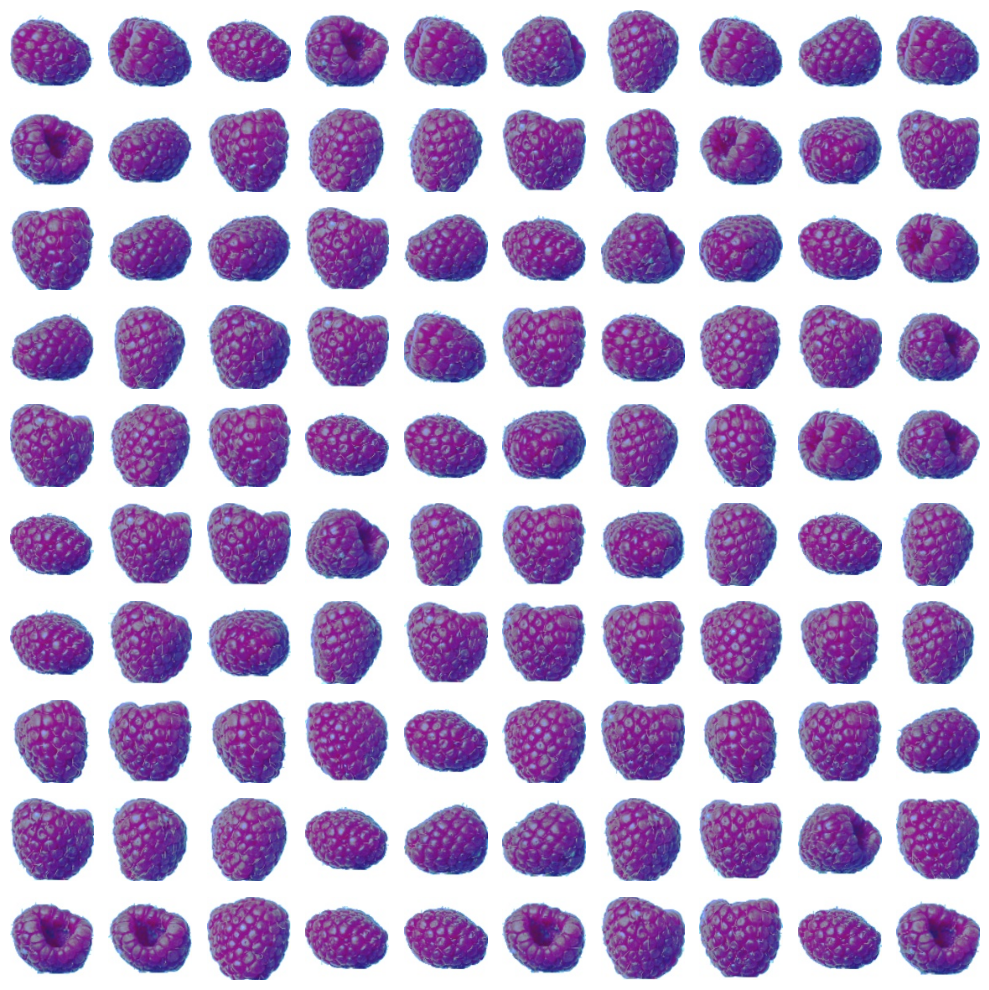

In [177]:
display_random_images(img_data_array[final_cluster_labels == 6], 100)

All of these are images of raspberries, so this will be the **Raspberry Cluster**

#### Cluster 5

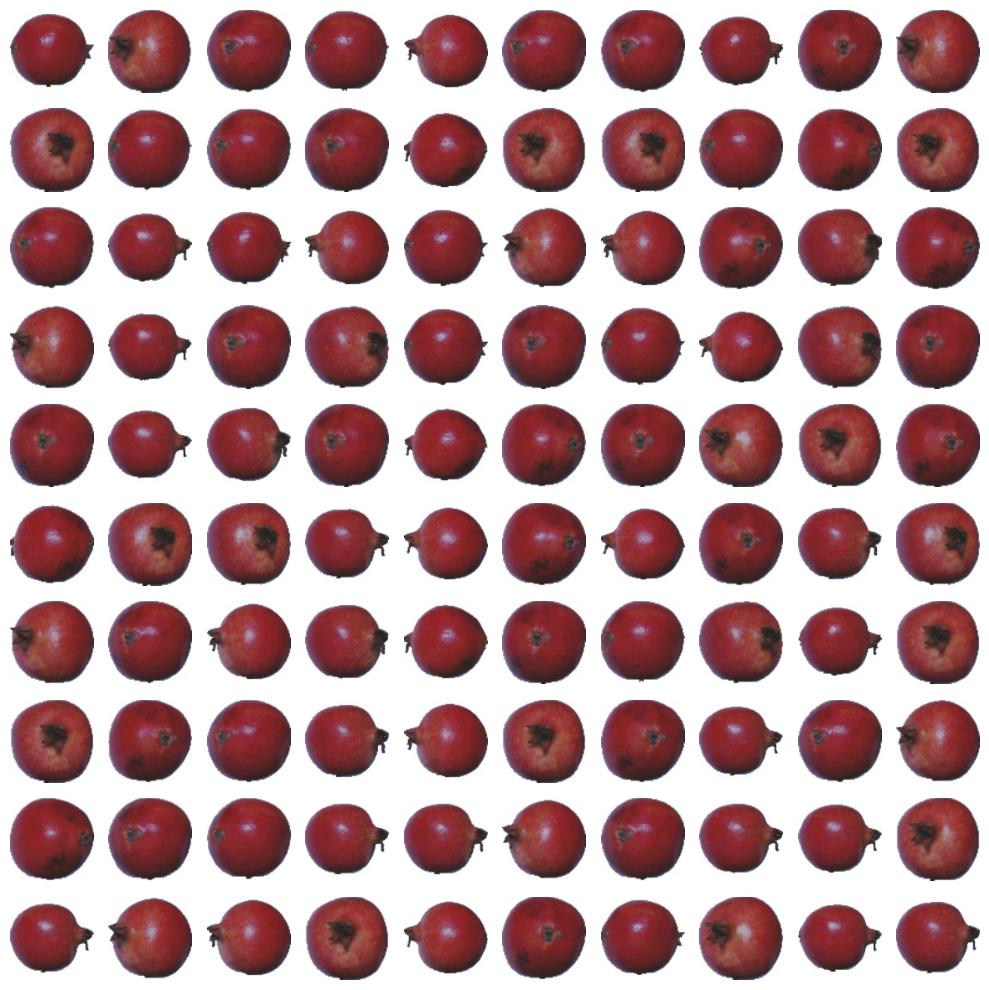

In [178]:
display_random_images(img_data_array[final_cluster_labels == 5], 100)

All of these are images of pomegranates, so this will be the **Pomegranate Cluster**

#### Cluster 4

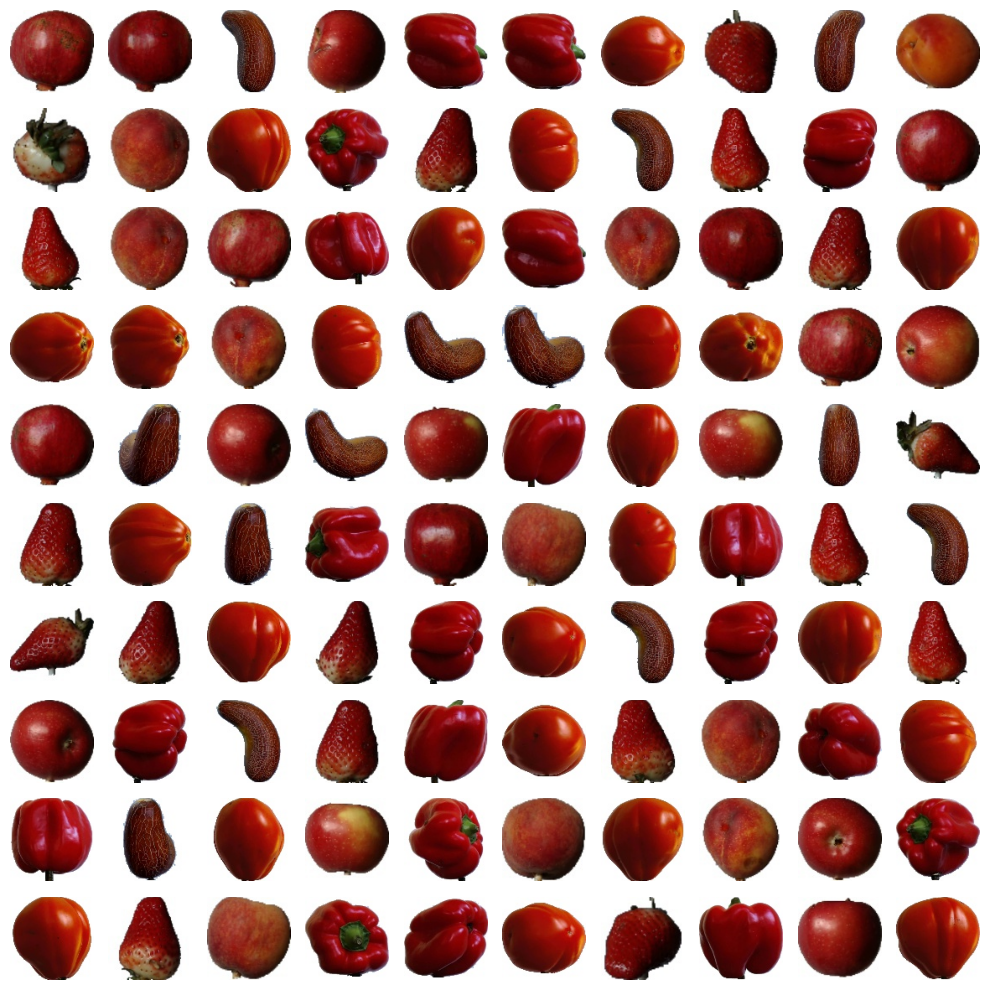

In [179]:
display_random_images(img_data_array[final_cluster_labels == 4], 100)

This is the first cluster that did not only contain images of a single type of fruit. The images in this cluster do all share a common color palate of dark red and dark green, with fruits such as cucumbers, strawberries, and red bell peppers. There also appear to be a few pomegranate images in this cluster that did not make it into the Pomegranate Cluster. This cluster will be called the **Dark Red-Dark Green Cluster** 

#### Cluster 3

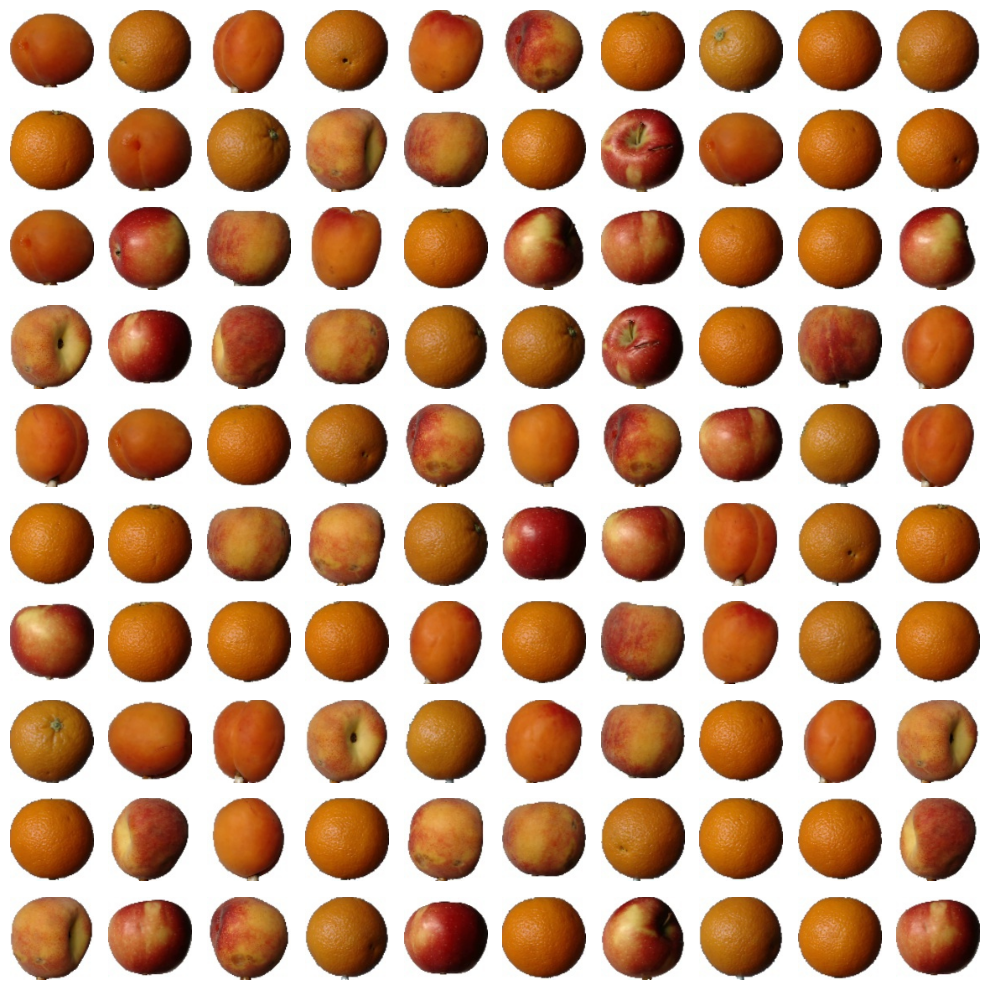

In [180]:
display_random_images(img_data_array[final_cluster_labels == 3], 100)

This cluster similarly contains multiple fruits that share an orange color palate, such as oranges, peaches, and apples. This will be called the **Orange Cluster**

#### Cluster 2

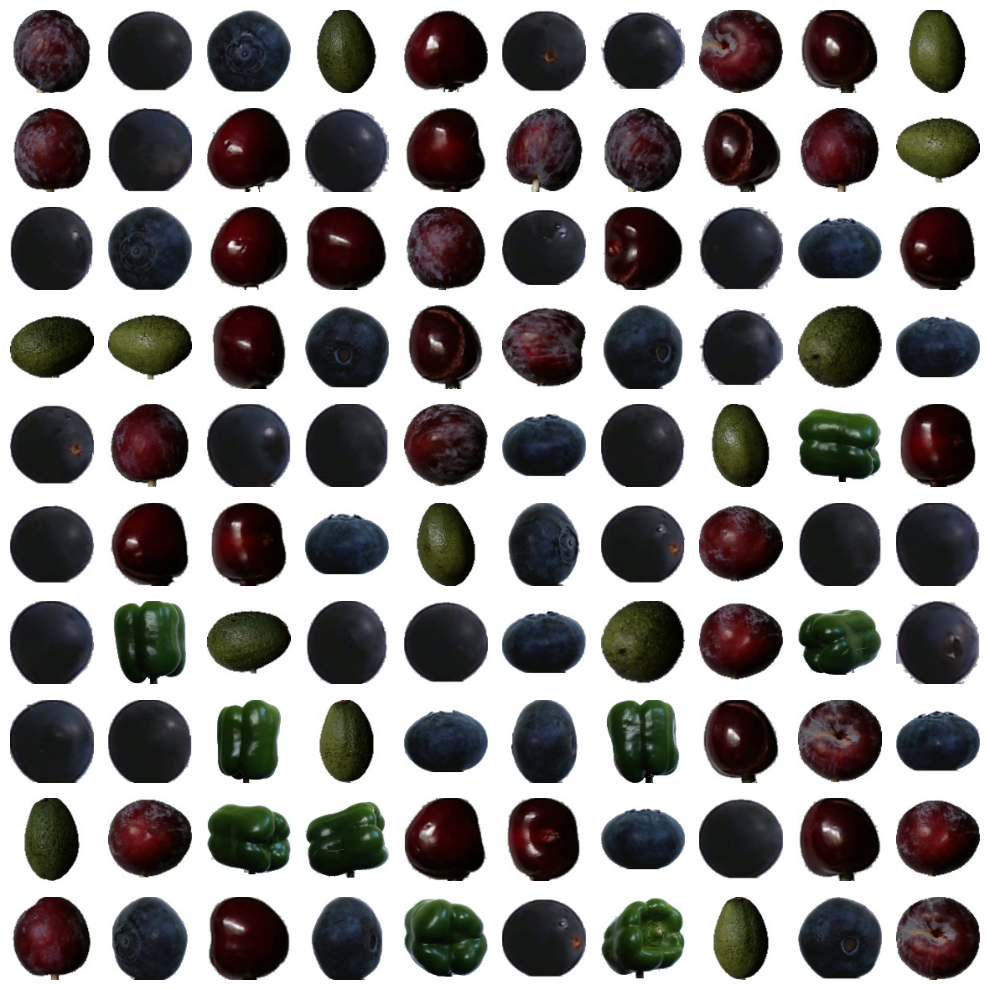

In [181]:
display_random_images(img_data_array[final_cluster_labels == 2], 100)

This cluster contains fruits that are mostly purple such as blueberries and plums, but also some dark green fruits like avocados and green bell peppers. It is possible that the dark green fruits in this cluster did not end up in the Dark Red-Dark Green cluster due to the shadows that darken them more and possibly make them appear more purple to the algorithm. This will be called the **Purple Cluster**

#### Cluster 1

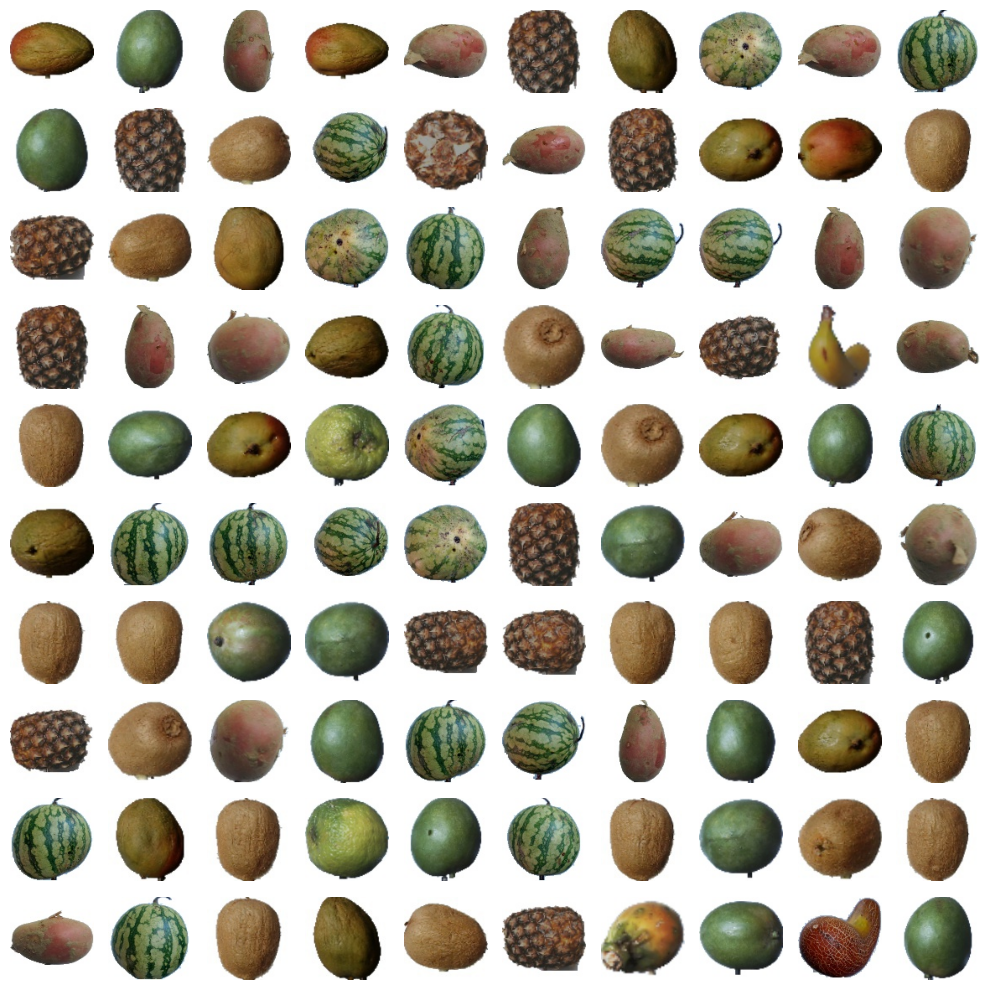

In [182]:
display_random_images(img_data_array[final_cluster_labels == 1], 100)

This cluster consists of light green fruits such as watermelon, kiwis, and passion fruit. This will be called the **Light Green Cluster**

#### Cluster 0

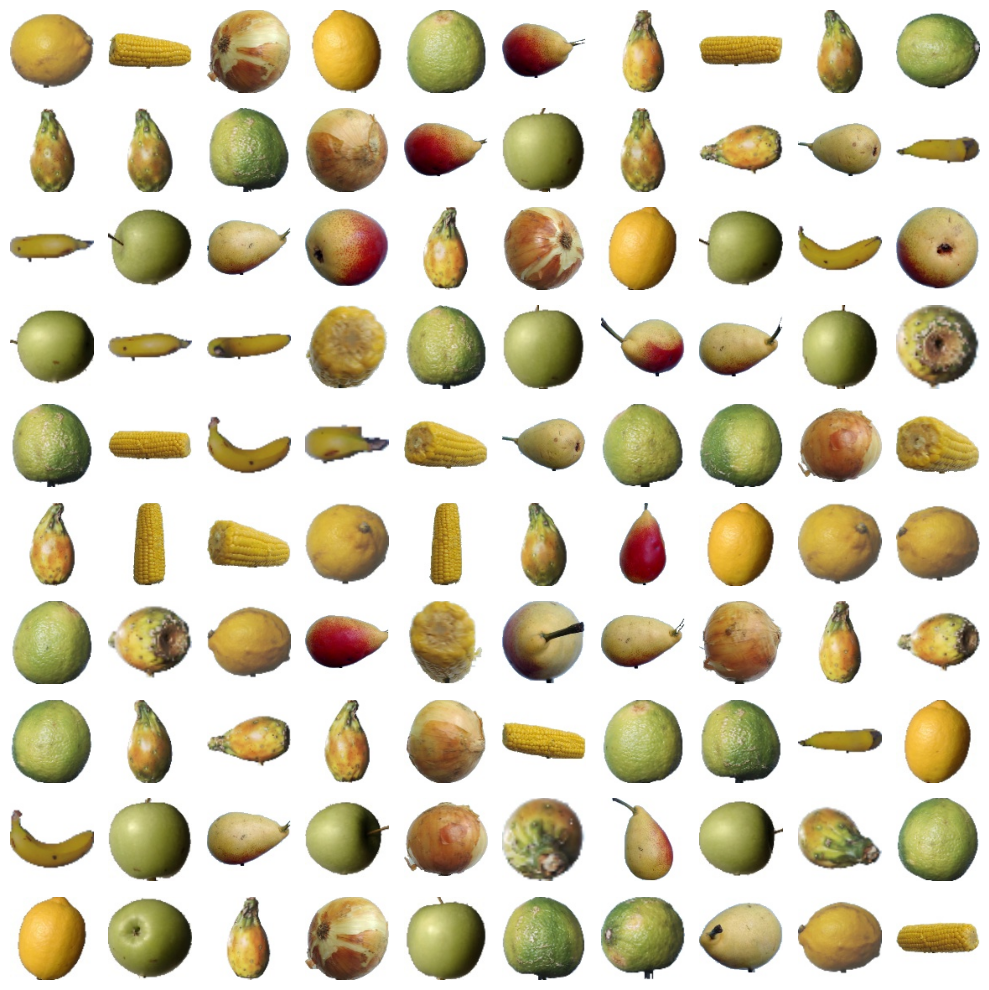

In [183]:
display_random_images(img_data_array[final_cluster_labels == 0], 100)

This final cluster contains images of yellow and some light green fruits such as bananas, corn, and lemons. This will be called the **Yellow Cluster** 

# Conclustion

The goal of this project was to use unsupervised learning techniques to learn about the contents of a dataset of fruit images through the use of clustering. Each image was converted from a raw RGB array to a color histogram as a method of extracting meaningful features from the images. The dimensionality of these color histograms was reduced using principal component analysis and clustering was performed using Agglomerative clustering, with the Silhouette Score being used as a performance metric to determine the number of principal components to use as well as choose the hyper-parameters of the clustering algorithm.

In the end, ten clusters were created by the algorithm, each with distinct visual interpretation. Some of the clusters represented individual fruits, while the rest represented shared color palates. Each fruit that made it into its own cluster had a distinct enough color palate to set itself apart from the other fruits in the dataset, but perhaps by increasing the number of clusters, more fruits could make it into their own cluster. In the end, the following cluster names were given to the ten clusters found.

1. Cantaloupe Cluster
2. Clementine Cluster
3. Passion Fruit Cluster
4. Raspberry Cluster
5. Pomegranate Cluster
6. Dark Red-Dark Green Cluster
7. Orange Cluster
8. Purple Cluster
9. Light Green Cluster
10. Yellow Cluster
